# Training and deployment of a YOLO11 model for Instance Segmentation

## 🌟 Overview

In this tutorial, you will learn how to work with the YOLO11 instance segmentation model from Ultralytics. We’ll guide you through downloading, training, and deploying the model on a Luxonis device, with clear code comments to help you follow along.

## 📜 Table of Contents
- [🛠️ Installation](#️installation)
- [🗃️ Data Preparation](#data-preparation)
- [🏋️‍♂️ Training](#️️training)
- [✍ Validation](#validation)
- [🧠 Infer](#infer)
- [💾 Weights Download](#weights)
- [🗂️ Conversion](#conversion)
- [📷 DepthAI Script](#depthai-script)

<a name="️installation"></a>

## 🛠️ Installation

We'll install all the dependencies we'll need.

In [ ]:
!pip install -q ultralytics depthai-nodes@git+https://github.com/luxonis/depthai-nodes.git@main -U
!pip install -q --extra-index-url https://artifacts.luxonis.com/artifactory/luxonis-python-release-local/ depthai==3.0.0a11

<a name ="data-preparation"></a>

## 🗃️ Data Preparation


If you use a custom dataset, you must prepare your dataset for training. Once you have set up a YAML file and sorted labels and images into the right directories, you can continue with the next step.

Luckily, we will be using `COCO8 Seg`, for which YAML already exists. You can check it out [here](https://github.com/ultralytics/ultralytics/blob/main/ultralytics/cfg/datasets/coco8-seg.yaml).

In case you need to train on a custom dataset, please follow these steps:

#### 1. Prepare your own dataset with images
#### 2. Generate label files in YOLO format

One image corresponds to one label text file. Object information per row. Each row contains the following information about the object instance:

- Object class index: An integer representing the class of the object (e.g., 0 for person, 1 for car, etc.).
- Object bounding coordinates: The bounding coordinates around the mask area, normalized to be between 0 and 1.

The label format example is below.
```txt
<class-index> <x1> <y1> <x2> <y2> ... <xn> <yn>
0 0.681 0.483 0.671 0.486 0.671 0.486 0.681 0.490
```

#### 3. Organize directories and create the `.yaml` file.

The config `.yaml` file should have the following structure:
```yaml
# Train/val/test sets as
# 1) dir: path/to/imgs
# 2) file: path/to/imgs.txt, or
# 3) list: [path/to/imgs1, path/to/imgs2, ..]
path: ../dataset/
train: # train images (relative to 'path')
val: # val images (relative to 'path')
test: # test images (optional)

# Classes
names:
  0: [class-0]
  1: [class-1]
  ...

# Download script/URL (optional)
download:
```

For more details about the format, please refer to [this](https://docs.ultralytics.com/datasets/segment/) page.


<a name ="️️training"></a>

## 🏋️‍♂️ Training


Before we begin the training, we have to choose the pre-trained model. This image from `Ultralytics` documentation quickly summarizes them. You can find more about the models [here](https://docs.ultralytics.com/tasks/segment/#models).

<img src="./media/model_zoo.png" alt="YOLO11 Instance Segmentation Model Zoo" width="640">

We select the `YOLO11n` as it is the smallest and quickest. You can also experiment with heavier models, but it might affect the FPS on our devices.

In [ ]:
from ultralytics import YOLO

# Load a pretrained model (recommended for training)
model = YOLO("yolo11n-seg.pt")

Before training, we can also launch the TensorBoard, which will allow us to inspect the training.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs/segment/train

We will set image size *img* to *640*. We will train the model for *1* *epoch*. We set *data* to `coco8-seg.yaml`.

For the actual training, *epochs* should be higher (typically between *300-1000* epochs).

In [4]:
# Train the model
results = model.train(data="coco8-seg.yaml", epochs=1, imgsz=640)

Ultralytics 8.3.68 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolo11n-seg.pt, data=coco8-seg.yaml, epochs=1, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, l

100%|██████████| 439k/439k [00:00<00:00, 13.5MB/s]
Unzipping /content/datasets/coco8-seg.zip to /content/datasets/coco8-seg...: 100%|██████████| 25/25 [00:00<00:00, 2128.27file/s]

Dataset download success ✅ (1.0s), saved to /content/datasets



100%|██████████| 755k/755k [00:00<00:00, 21.2MB/s]



                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

100%|██████████| 5.35M/5.35M [00:00<00:00, 92.1MB/s]


AMP: checks passed ✅


train: Scanning /content/datasets/coco8-seg/labels/train... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<00:00, 1351.26it/s]

train: New cache created: /content/datasets/coco8-seg/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.2 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/datasets/coco8-seg/labels/val... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<00:00, 462.51it/s]

val: New cache created: /content/datasets/coco8-seg/labels/val.cache


Plotting labels to runs/segment/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000119, momentum=0.9) with parameter groups 90 weight(decay=0.0), 101 weight(decay=0.0005), 100 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/train
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


        1/1     0.981G      1.021      2.658      3.378      1.315         30        640: 100%|██████████| 1/1 [00:02<00:00,  2.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


                   all          4         17      0.781      0.892      0.939      0.668      0.723      0.833      0.822      0.564

1 epochs completed in 0.005 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 6.1MB
Optimizer stripped from runs/segment/train/weights/best.pt, 6.1MB

Validating runs/segment/train/weights/best.pt...
Ultralytics 8.3.68 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n-seg summary (fused): 265 layers, 2,868,664 parameters, 0 gradients, 10.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.09it/s]


                   all          4         17      0.778      0.893      0.939      0.668      0.719      0.833      0.822      0.564
                person          3         10      0.731        0.5       0.66      0.308      0.731        0.5      0.616      0.246
                   dog          1          1      0.731          1      0.995      0.895      0.731          1      0.995      0.895
                 horse          1          2      0.613          1      0.995      0.581      0.613          1      0.828        0.2
              elephant          1          2          1      0.856      0.995      0.334      0.644        0.5        0.5       0.25
              umbrella          1          1      0.666          1      0.995      0.995      0.666          1      0.995      0.895
          potted plant          1          1      0.926          1      0.995      0.895      0.926          1      0.995      0.895
Speed: 0.3ms preprocess, 10.3ms inference, 0.0ms loss, 2.3ms postproc

<a name ="validation"></a>

## ✍ Validation

After training our model, we can validate it on the validation set of our dataset.

In [5]:
metrics = model.val()

Ultralytics 8.3.68 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n-seg summary (fused): 265 layers, 2,868,664 parameters, 0 gradients, 10.4 GFLOPs


val: Scanning /content/datasets/coco8-seg/labels/val.cache... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]


                   all          4         17      0.782      0.892       0.94      0.669      0.723      0.833      0.822      0.561
                person          3         10      0.746        0.5      0.663       0.31      0.746        0.5      0.617      0.228
                   dog          1          1      0.734          1      0.995      0.895      0.734          1      0.995      0.895
                 horse          1          2      0.616          1      0.995      0.581      0.616          1      0.828        0.2
              elephant          1          2          1      0.854      0.995      0.334      0.646        0.5        0.5       0.25
              umbrella          1          1      0.668          1      0.995      0.995      0.668          1      0.995      0.895
          potted plant          1          1      0.926          1      0.995      0.895      0.926          1      0.995      0.895
Speed: 0.4ms preprocess, 36.4ms inference, 0.0ms loss, 1.2ms postproc

<a name ="infer"></a>

## 🧠 Infer

Usually, we also want to visualize the prediction of the trained model on some image to ensure it does what it is supposed to do. This is called inference, and we'll perform it on one image.

100%|██████████| 134k/134k [00:00<00:00, 7.04MB/s]

image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 1 stop sign, 116.4ms
Speed: 5.3ms preprocess, 116.4ms inference, 4.8ms postprocess per image at shape (1, 3, 640, 480)


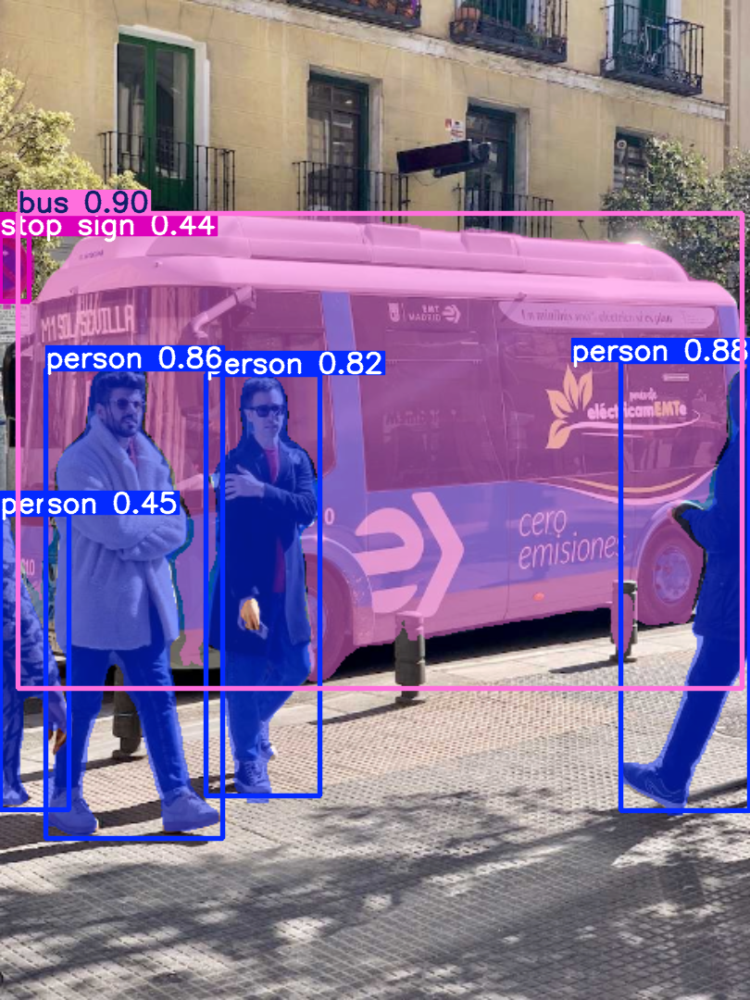

In [6]:
results = model("https://ultralytics.com/images/bus.jpg")  # predict on an image
results[0].show()  # display to screen

<a name="weights"></a>

## 💾 Weights Download

By default, the library saves the weights with the best performance into the `best.pt` file inside the corresponding run folder. We'll rename it to reflect the model better.

In [8]:
!cp runs/segment/train/weights/best.pt yolo11n_instance_segmentation_trained.pt

If you are experiencing the following error:

```
NotImplementedError: A UTF-8 locale is required. Got ANSI_X3.4-1968
```

Please run the following command and rerun the previous command:

```python
import locale
locale.getpreferredencoding = lambda: "UTF-8"
```

We'll download the weights to convert them in the next step.

In [9]:
from google.colab import files
files.download("yolo11n_instance_segmentation_trained.pt")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

We have the trained model, and the goal is to deploy it to the Luxonis device. The model's specific format depends on the Luxonis device series you have. To simplify the process, we recommend you use our [`HubAI`](https://hub.luxonis.com) platform. You can log in, navigate to the AI section, and click the `+ Add Model` button.

Please select `YOLO` as a model type.

<img src="./media/hub_model_type.png" alt="HubAI model type selection" width="640">

Then, choose your desired target platform (RVC2, RVC3, or RVC4). In our case, we will use RVC2.

<img src="./media/hubai_target_platform.png" alt="HubAI model platform selection" width="640">

Then, fill out the form on the image below with the information about your model.

<img src="./media/model_upload.png" alt="Exported model on HubAI" width="640">

After that, fill in specific information about the RVC2 export.

You can copy the class names from here:
```text
person,bicycle,car,motorcycle,airplane,bus,train,truck,boat,traffic light,fire hydrant,stop sign,parking meter,bench,bird,cat,dog,horse,sheep,cow,elephant,bear,zebra,giraffe,backpack,umbrella,handbag,tie,suitcase,frisbee,skis,snowboard,sports ball,kite,baseball bat,baseball glove,skateboard,surfboard,tennis racket,bottle,wine glass,cup,fork,knife,spoon,bowl,banana,apple,sandwich,orange,broccoli,carrot,hot dog,pizza,donut,cake,chair,couch,potted plant,bed,dining table,toilet,tv,laptop,mouse,remote,keyboard,cell phone,microwave,oven,toaster,sink,refrigerator,book,clock,vase,scissors,teddy bear,hair drier,toothbrush
```

<img src="./media/model_rvc2.png" alt="Exported model on HubAI" width="640">

Choose the input image size. In our case, we will use `512x288`.

<img src="./media/yolo_rvc2_shape.png" alt="Exported model on HubAI" width="640">

Finally, click `Export` and wait for the model to be converted. The process might take some time, but after it's finished, we can download the model and use it with our DepthAI script. We'll use RVC2 in this tutorial, but you can follow the same process for other versions. All that is left to do is create a DepthAI script and deploy the model to the device. We already made such an example below. There are two variables that you need to populate, though:
- `ModelSlug`: This is a string representation of your model version based on which DepthAI can download it. You can get it by clicking the `Copy` button next to the `Convert` you used before.
- `ApiToken`: Since this model is private to your team, you need a token to access it. To generate the token, we navigate to team settings and click `+ Create API Token`. We then copy and paste it into the script below.

<img src="./media/model_card.png" alt="Exported model on HubAI" width="800">

In [ ]:
MODEL_SLUG = "insert_your_model_slug_here" # TODO: Insert your model slug
API_TOKEN = "insert_your_token_here" # TODO: Insert your API Token

To check out other possible ways to convert your model for our devices, please refer to our [documentation](https://rvc4.docs.luxonis.com/software/ai-inference/conversion/rvc-conversion/).

<a name="depthai-script"></a>

## 📷 DepthAI Script

Here is the script to run the model on the DepthAI device:

In [ ]:
import cv2
import depthai as dai
import numpy as np
from depthai_nodes import ParsingNeuralNetwork
from depthai_nodes.ml.messages import (
    ImgDetectionExtended,
    ImgDetectionsExtended
)
from typing import List
import os

os.environ["DEPTHAI_HUB_API_KEY"] = API_TOKEN

labels = [
    "person",         "bicycle",    "car",           "motorbike",     "aeroplane",   "bus",           "train",
    "truck",          "boat",       "traffic light", "fire hydrant",  "stop sign",   "parking meter", "bench",
    "bird",           "cat",        "dog",           "horse",         "sheep",       "cow",           "elephant",
    "bear",           "zebra",      "giraffe",       "backpack",      "umbrella",    "handbag",       "tie",
    "suitcase",       "frisbee",    "skis",          "snowboard",     "sports ball", "kite",          "baseball bat",
    "baseball glove", "skateboard", "surfboard",     "tennis racket", "bottle",      "wine glass",    "cup",
    "fork",           "knife",      "spoon",         "bowl",          "banana",      "apple",         "sandwich",
    "orange",         "broccoli",   "carrot",        "hot dog",       "pizza",       "donut",         "cake",
    "chair",          "sofa",       "pottedplant",   "bed",           "diningtable", "toilet",        "tvmonitor",
    "laptop",         "mouse",      "remote",        "keyboard",      "cell phone",  "microwave",     "oven",
    "toaster",        "sink",       "refrigerator",  "book",          "clock",       "vase",          "scissors",
    "teddy bear",     "hair drier", "toothbrush"
]

def draw_extended_image_detections(
    frame: np.ndarray, detections: List[ImgDetectionExtended], labels=None
):
    """Draws (rotated) bounding boxes on the given frame."""

    for detection in detections:
        rect = detection.rotated_rect
        points = rect.getPoints()

        bbox = np.array([[point.x, point.y] for point in points])
        if np.any(bbox < 1):
            bbox[:, 0] = bbox[:, 0] * frame.shape[1]
            bbox[:, 1] = bbox[:, 1] * frame.shape[0]
        bbox = bbox.astype(int)
        cv2.polylines(frame, [bbox], isClosed=True, color=(255, 0, 0), thickness=2)

        outer_points = rect.getOuterRect()
        xmin = int(outer_points[0] * frame.shape[1])
        ymin = int(outer_points[1] * frame.shape[0])
        cv2.putText(
            frame,
            f"{detection.confidence * 100:.2f}%",
            (xmin + 10, ymin + 20),
            cv2.FONT_HERSHEY_TRIPLEX,
            0.5,
            (255, 0, 0),
        )
        if labels is not None:
            cv2.putText(
                frame,
                labels[detection.label],
                (xmin + 10, ymin + 40),
                cv2.FONT_HERSHEY_TRIPLEX,
                0.5,
                (255, 0, 0),
            )

    return frame


def visualize_yolo_extended(
    frame: np.ndarray, message: ImgDetectionsExtended, extraParams: dict
):
    """Visualizes the YOLO pose detections or instance segmentation on the frame."""

    detections = message.detections
    classes = extraParams.get("classes", None)

    if classes is None:
        raise ValueError("Classes are required for visualization.")

    frame = draw_extended_image_detections(frame, detections, classes)

    mask = message.masks
    mask = mask > -0.5
    frame[mask] = frame[mask] * 0.5 + np.array((0, 255, 0)) * 0.5

    cv2.imshow("YOLO Instance Segmentation", frame)
    if cv2.waitKey(1) == ord("q"):
        cv2.destroyAllWindows()
        return True

    return False


device = dai.Device()
platform = device.getPlatform()

nn_archive = dai.NNArchive(dai.getModelFromZoo(dai.NNModelDescription(MODEL_SLUG, platform.name)))

with dai.Pipeline(device) as pipeline:
    cam = pipeline.create(dai.node.Camera).build()
    nn_with_parser = pipeline.create(ParsingNeuralNetwork).build(
        cam.requestOutput((512, 288), type=dai.ImgFrame.Type.BGR888p), 
        nn_archive
    )
    parser_output_queue = nn_with_parser.out.createOutputQueue()
    frame_queue = nn_with_parser.passthrough.createOutputQueue()

    pipeline.start()

    while pipeline.isRunning():
        frame: np.ndarray = frame_queue.get().getCvFrame()
        nn_output: dai.ImgDetections = parser_output_queue.get()

        if visualize_yolo_extended(frame, nn_output, extraParams={"classes": labels}):
            pipeline.stop()
            break

Yay! 🎉🎉🎉 Huge congratulations, you have successfully finished this tutorial in which you trained and deployed a pre-trained YOLO11 nano instance segmentation model to our cameras!